In [7]:
# Mount Google Drive if needed
from google.colab import drive
drive.mount('/content/drive')

# Install required packages
!pip install -q kaggle ultralytics

# Upload your Kaggle API token
from google.colab import files
files.upload()  # Upload kaggle.json

# Move kaggle.json to proper location
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Download and extract PCB Defects dataset
!kaggle datasets download -d akhatova/pcb-defects -p /content
!unzip -q /content/pcb-defects.zip -d /content/pcb-defects


Mounted at /content/drive
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 35.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 62.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 33.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 35.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 77.4 MB/s eta 0:00:00


Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/akhatova/pcb-defects
License(s): unknown
 99% 1.86G/1.88G [00:09<00:00, 161MB/s]
100% 1.88G/1.88G [00:09<00:00, 212MB/s]


In [ ]:
!conda create -n yolov12_env python=3.10 -y
!conda activate yolov12_env

/bin/bash: line 1: conda: command not found
/bin/bash: line 1: conda: command not found


In [8]:
import os, shutil, random, xml.etree.ElementTree as ET
from glob import glob

root_dir = "/content/pcb-defects"
all_xmls = glob(os.path.join(root_dir, "**", "*.xml"), recursive=True)
all_images = glob(os.path.join(root_dir, "**", "*.*"), recursive=True)
all_images = [f for f in all_images if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

image_map = {os.path.splitext(os.path.basename(p))[0]: p for p in all_images}

# Create YOLO folders
base_yolo = "/content/pcb_defects_yolo"
for split in ["train", "val"]:
    os.makedirs(os.path.join(base_yolo, f"images/{split}"), exist_ok=True)
    os.makedirs(os.path.join(base_yolo, f"labels/{split}"), exist_ok=True)

# Class list
classes = ['missing_hole','mouse_bite','open_circuit','short','spur','spurious_copper']

# Shuffle and split
random.shuffle(all_xmls)
split_idx = int(0.8 * len(all_xmls))
train_xmls = all_xmls[:split_idx]
val_xmls = all_xmls[split_idx:]

def convert(xmls, split):
    for xml in xmls:
        base = os.path.splitext(os.path.basename(xml))[0]
        image_path = image_map.get(base)
        if not image_path: continue

        # Copy image
        shutil.copy(image_path, os.path.join(base_yolo, f"images/{split}", os.path.basename(image_path)))

        # Convert annotation
        tree = ET.parse(xml)
        root = tree.getroot()
        w = float(root.find('size/width').text)
        h = float(root.find('size/height').text)
        label_path = os.path.join(base_yolo, f"labels/{split}", base + '.txt')
        with open(label_path, 'w') as f:
            for obj in root.iter('object'):
                cls = obj.find('name').text.lower()
                if cls not in classes: continue
                cid = classes.index(cls)
                b = obj.find('bndbox')
                xmin, ymin = float(b.find('xmin').text), float(b.find('ymin').text)
                xmax, ymax = float(b.find('xmax').text), float(b.find('ymax').text)
                x_c = ((xmin+xmax)/2)/w
                y_c = ((ymin+ymax)/2)/h
                bw = (xmax - xmin)/w
                bh = (ymax - ymin)/h
                f.write(f"{cid} {x_c:.6f} {y_c:.6f} {bw:.6f} {bh:.6f}\n")

convert(train_xmls, "train")
convert(val_xmls, "val")


In [9]:
%%writefile pcb.yaml
path: /content/pcb_defects_yolo
train: images/train
val: images/val

nc: 6
names: ['missing_hole', 'mouse_bite', 'open_circuit', 'short', 'spur', 'spurious_copper']


Writing pcb.yaml


In [ ]:
from ultralytics import YOLO

# Use yolov8n.pt temporarily if yolo12n.pt is not available
model = YOLO("yolo12n.pt")

results = model.train(
    data="pcb.yaml",
    epochs=60,
    imgsz=640,
    batch=16,
    lr0=0.002
)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 5.34M/5.34M [00:00<00:00, 98.5MB/s]


Ultralytics 8.3.147 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=pcb.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=60, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.002, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo12n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=True, profile=Fals

100%|██████████| 755k/755k [00:00<00:00, 126MB/s]

Overriding model.yaml nc=80 with nc=6

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  2    180864  ultralytics.nn.modules.block.A2C2f           [128, 128, 2, True, 4]        
  7                  -1  1    295424  ultralytics

  8                  -1  2    689408  ultralytics.nn.modules.block.A2C2f           [256, 256, 2, True, 1]        
  9                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 10             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 11                  -1  1     86912  ultralytics.nn.modules.block.A2C2f           [384, 128, 1, False, -1]      
 12                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 13             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 14                  -1  1     24000  ultralytics.nn.modules.block.A2C2f           [256, 64, 1, False, -1]       
 15                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
 16            [-1, 11]  1         0  ultralytics.nn.modules.conv.Concat           [1]  

100%|██████████| 5.35M/5.35M [00:00<00:00, 301MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2611.1±1527.7 MB/s, size: 1409.3 KB)


train: Scanning /content/pcb_defects_yolo/labels/train... 554 images, 0 backgrounds, 0 corrupt: 100%|██████████| 554/554 [00:00<00:00, 1602.14it/s]

train: New cache created: /content/pcb_defects_yolo/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2281.2±1509.0 MB/s, size: 1249.6 KB)


val: Scanning /content/pcb_defects_yolo/labels/val... 139 images, 0 backgrounds, 0 corrupt: 100%|██████████| 139/139 [00:00<00:00, 1231.58it/s]

val: New cache created: /content/pcb_defects_yolo/labels/val.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.002' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.0005), 119 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 60 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/60      3.36G      3.492      7.159      1.564         62        640: 100%|██████████| 35/35 [00:33<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.21it/s]

                   all        139        585          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/60      3.92G       2.77       5.23      1.157         60        640: 100%|██████████| 35/35 [00:34<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.22it/s]

                   all        139        585   0.000506     0.0098    0.00699    0.00197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/60      3.93G      2.632       4.38      1.091         63        640: 100%|██████████| 35/35 [00:33<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.65it/s]

                   all        139        585      0.582     0.0656      0.134     0.0474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/60      3.95G      2.536      3.672      1.081         86        640: 100%|██████████| 35/35 [00:32<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.95it/s]

                   all        139        585      0.296      0.307      0.217     0.0794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/60      3.96G      2.413      3.196       1.05         78        640: 100%|██████████| 35/35 [00:33<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.01it/s]

                   all        139        585      0.397      0.261      0.241      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/60      3.98G       2.27      2.874      1.015         67        640: 100%|██████████| 35/35 [00:34<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.58it/s]

                   all        139        585      0.389      0.375      0.359      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/60      3.99G      2.218      2.632      1.013         44        640: 100%|██████████| 35/35 [00:32<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.14it/s]

                   all        139        585      0.502      0.408      0.425      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/60      4.01G      2.201       2.48      1.016         70        640: 100%|██████████| 35/35 [00:34<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.50it/s]

                   all        139        585      0.556      0.481      0.505      0.217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/60      4.02G      2.171      2.331     0.9918         52        640: 100%|██████████| 35/35 [00:31<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.58it/s]

                   all        139        585       0.64      0.524      0.554      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/60      4.04G       2.12      2.159      1.005         77        640: 100%|██████████| 35/35 [00:32<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.21it/s]

                   all        139        585      0.607      0.524      0.586      0.263



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/60      4.05G      2.084       2.12       0.98         52        640: 100%|██████████| 35/35 [00:33<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.87it/s]

                   all        139        585      0.641      0.539      0.619      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/60      4.07G      2.072       1.99      1.001         63        640: 100%|██████████| 35/35 [00:32<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.31it/s]

                   all        139        585      0.732      0.629      0.688      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/60      4.08G      2.056       1.85      0.972         54        640: 100%|██████████| 35/35 [00:33<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.01it/s]

                   all        139        585      0.685      0.592      0.667      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/60       4.1G      1.999       1.76      0.974         76        640: 100%|██████████| 35/35 [00:32<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.58it/s]

                   all        139        585      0.677      0.651      0.686      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/60      4.11G      1.943      1.697     0.9565         60        640: 100%|██████████| 35/35 [00:35<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.42it/s]

                   all        139        585      0.809      0.689      0.753      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/60      4.12G      2.008      1.623     0.9699         64        640: 100%|██████████| 35/35 [00:32<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.23it/s]

                   all        139        585      0.827      0.703      0.769      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/60      4.14G      1.943      1.636     0.9519         59        640: 100%|██████████| 35/35 [00:34<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.31it/s]

                   all        139        585      0.806      0.693      0.758      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/60      4.16G      1.923      1.581     0.9562         56        640: 100%|██████████| 35/35 [00:33<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.12it/s]

                   all        139        585      0.821      0.739      0.798      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/60      4.17G      1.931      1.548     0.9625         32        640: 100%|██████████| 35/35 [00:33<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.26it/s]

                   all        139        585      0.859      0.731      0.794      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/60      4.19G      1.952      1.547     0.9617         92        640: 100%|██████████| 35/35 [00:32<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.46it/s]

                   all        139        585      0.891      0.738      0.814      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/60       4.2G      1.913      1.473     0.9516         73        640: 100%|██████████| 35/35 [00:32<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.17it/s]

                   all        139        585      0.863       0.72      0.796      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/60      4.21G      1.845      1.366     0.9447         64        640: 100%|██████████| 35/35 [00:33<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.15it/s]

                   all        139        585       0.88      0.714      0.807      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/60      4.22G      1.901      1.392     0.9531         62        640: 100%|██████████| 35/35 [00:32<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.28it/s]

                   all        139        585      0.889      0.789       0.85       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/60      4.24G      1.838      1.362     0.9363         60        640: 100%|██████████| 35/35 [00:32<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.99it/s]

                   all        139        585      0.886      0.786      0.851      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/60      4.26G      1.856      1.344     0.9406         59        640: 100%|██████████| 35/35 [00:34<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.97it/s]

                   all        139        585       0.86      0.795      0.846      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/60      4.27G      1.843      1.319     0.9386         69        640: 100%|██████████| 35/35 [00:31<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.43it/s]

                   all        139        585      0.844      0.807      0.854      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/60      4.28G      1.823      1.298     0.9389         80        640: 100%|██████████| 35/35 [00:32<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.10it/s]

                   all        139        585      0.881      0.797      0.847      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/60       4.3G      1.775       1.24     0.9221         81        640: 100%|██████████| 35/35 [00:34<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.24it/s]

                   all        139        585      0.856      0.794      0.832      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/60      4.32G      1.843      1.269     0.9407         51        640: 100%|██████████| 35/35 [00:32<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.48it/s]

                   all        139        585      0.894      0.763       0.84      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/60      4.33G       1.84      1.274      0.925         65        640: 100%|██████████| 35/35 [00:33<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.00it/s]

                   all        139        585      0.911      0.794      0.864      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/60      4.34G      1.788      1.195     0.9285         38        640: 100%|██████████| 35/35 [00:33<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.99it/s]

                   all        139        585      0.914      0.789      0.854      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/60      4.36G      1.768      1.176     0.9213         55        640: 100%|██████████| 35/35 [00:32<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.67it/s]

                   all        139        585      0.922       0.82      0.876      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/60      4.38G      1.799      1.206     0.9237         75        640: 100%|██████████| 35/35 [00:31<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.11it/s]

                   all        139        585      0.909      0.798      0.858      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/60      4.39G      1.791      1.183     0.9362         64        640: 100%|██████████| 35/35 [00:35<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.01it/s]

                   all        139        585      0.848      0.806      0.857      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/60       4.4G      1.765      1.156     0.9158         59        640: 100%|██████████| 35/35 [00:32<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.17it/s]

                   all        139        585      0.899       0.81      0.876      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/60      4.42G      1.745      1.148     0.9244         89        640: 100%|██████████| 35/35 [00:33<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.90it/s]

                   all        139        585      0.903      0.806      0.868      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/60      4.44G      1.768      1.174     0.9142         59        640: 100%|██████████| 35/35 [00:34<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.18it/s]

                   all        139        585      0.888      0.799      0.868      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/60      4.45G      1.776      1.158     0.9194         78        640: 100%|██████████| 35/35 [00:33<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.93it/s]

                   all        139        585      0.878      0.782      0.851      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/60      4.46G      1.718      1.089     0.9148         51        640: 100%|██████████| 35/35 [00:33<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.98it/s]

                   all        139        585      0.918      0.826      0.881      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/60      4.48G      1.677      1.075     0.9088         65        640: 100%|██████████| 35/35 [00:33<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.75it/s]

                   all        139        585      0.872      0.816      0.866      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/60       4.5G      1.671       1.06      0.912         63        640: 100%|██████████| 35/35 [00:31<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.99it/s]

                   all        139        585      0.906      0.847      0.892      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/60      4.51G      1.725      1.074       0.91         78        640: 100%|██████████| 35/35 [00:33<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.26it/s]

                   all        139        585      0.932      0.834       0.89      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/60      4.52G      1.692      1.053      0.909         64        640: 100%|██████████| 35/35 [00:33<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.35it/s]

                   all        139        585      0.902      0.845      0.896      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/60      4.54G      1.667      1.022     0.8998         47        640: 100%|██████████| 35/35 [00:33<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.60it/s]


                   all        139        585      0.943      0.831      0.899      0.455

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/60      4.56G      1.682      1.032     0.9066         71        640: 100%|██████████| 35/35 [00:33<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.11it/s]

                   all        139        585      0.899      0.818      0.885      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/60      4.57G      1.681      1.022     0.9048         47        640: 100%|██████████| 35/35 [00:32<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.13it/s]

                   all        139        585      0.902       0.84      0.892      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/60      4.58G      1.652      0.998     0.9055         58        640: 100%|██████████| 35/35 [00:34<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.19it/s]

                   all        139        585       0.92      0.825      0.888      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/60       4.6G      1.624     0.9893     0.9075         65        640: 100%|██████████| 35/35 [00:33<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.93it/s]

                   all        139        585      0.943      0.842        0.9      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/60      4.61G      1.681       1.04     0.9033         63        640: 100%|██████████| 35/35 [00:32<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.97it/s]

                   all        139        585      0.943      0.835      0.898      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/60      4.63G       1.61     0.9679     0.8972         66        640: 100%|██████████| 35/35 [00:32<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.11it/s]

                   all        139        585      0.947      0.833      0.898      0.464


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/60      4.64G       1.64     0.9947     0.9193         44        640: 100%|██████████| 35/35 [00:37<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.15it/s]

                   all        139        585      0.927      0.826      0.892      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/60      4.66G      1.548     0.9118      0.912         39        640: 100%|██████████| 35/35 [00:33<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.83it/s]

                   all        139        585      0.917      0.845      0.896      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/60      4.67G      1.552      0.902     0.9112         41        640: 100%|██████████| 35/35 [00:32<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.07it/s]

                   all        139        585      0.937      0.839      0.895      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/60      4.69G       1.51     0.8809     0.9041         38        640: 100%|██████████| 35/35 [00:34<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.11it/s]

                   all        139        585       0.93      0.853      0.904      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/60       4.7G      1.529      0.894     0.8948         43        640: 100%|██████████| 35/35 [00:32<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.32it/s]

                   all        139        585      0.925      0.849      0.902      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/60      4.72G      1.513     0.8655     0.9048         39        640: 100%|██████████| 35/35 [00:31<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.03it/s]

                   all        139        585      0.934       0.85      0.908       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/60      4.73G      1.491     0.8314     0.9051         36        640: 100%|██████████| 35/35 [00:31<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.40it/s]

                   all        139        585      0.923       0.86      0.905      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/60      4.75G      1.505     0.8402     0.9016         47        640: 100%|██████████| 35/35 [00:32<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.47it/s]

                   all        139        585      0.921      0.872      0.908      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/60      4.76G        1.5     0.8364     0.8968         40        640: 100%|██████████| 35/35 [00:33<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.11it/s]

                   all        139        585      0.929      0.855      0.907      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/60      4.78G      1.476     0.8303     0.8897         42        640: 100%|██████████| 35/35 [00:32<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.68it/s]

                   all        139        585      0.928      0.859      0.909      0.471



60 epochs completed in 0.626 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.147 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12n summary (fused): 159 layers, 2,557,898 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.09s/it]


                   all        139        585      0.921      0.874       0.91      0.474
          missing_hole         24        102      0.992       0.98      0.993      0.619
            mouse_bite         25        102      0.872      0.803      0.869      0.419
          open_circuit         29        120      0.883       0.85      0.895      0.441
                 short         26        112      0.926      0.938      0.957      0.442
                  spur         16         60      0.923       0.75      0.783      0.411
       spurious_copper         19         89      0.929      0.921      0.961      0.513
Speed: 0.2ms preprocess, 3.6ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to runs/detect/train


In [ ]:
from ultralytics import YOLO

# Load the previously trained weights (not resuming, just initializing from best.pt)
model = YOLO("/content/runs/detect/train/weights/best.pt")

# Start new training (will continue learning from where it left off)
results = model.train(
    data="pcb.yaml",
    epochs=50,         # extra epochs you want
    imgsz=640,
    batch=16,
    lr0=0.001,         # reduced LR for fine-tuning
    pretrained=True    # ensures it initializes with weights
)


Ultralytics 8.3.147 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=pcb.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/runs/detect/train/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train6, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12

train: Scanning /content/pcb_defects_yolo/labels/train.cache... 554 images, 0 backgrounds, 0 corrupt: 100%|██████████| 554/554 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1783.2±1715.4 MB/s, size: 1249.6 KB)


val: Scanning /content/pcb_defects_yolo/labels/val.cache... 139 images, 0 backgrounds, 0 corrupt: 100%|██████████| 139/139 [00:00<?, ?it/s]


Plotting labels to runs/detect/train6/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.0005), 119 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train6
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      6.62G      1.659      1.012      0.896         62        640: 100%|██████████| 35/35 [00:31<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.05it/s]

                   all        139        585       0.93      0.837      0.901      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      7.16G      1.725      1.067     0.9073         60        640: 100%|██████████| 35/35 [00:33<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.28it/s]

                   all        139        585      0.896      0.824      0.875      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      7.16G      1.753      1.102     0.9107         63        640: 100%|██████████| 35/35 [00:34<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.69it/s]

                   all        139        585      0.892      0.803      0.859      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      7.16G       1.79      1.121     0.9206         86        640: 100%|██████████| 35/35 [00:32<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.09it/s]

                   all        139        585      0.909      0.754      0.847      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      7.16G      1.822      1.158     0.9208         78        640: 100%|██████████| 35/35 [00:33<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.05it/s]

                   all        139        585      0.851      0.761      0.835      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      7.16G       1.76      1.115     0.9106         67        640: 100%|██████████| 35/35 [00:32<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.30it/s]

                   all        139        585      0.918      0.777      0.845      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      7.16G      1.742      1.108     0.9143         44        640: 100%|██████████| 35/35 [00:32<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.56it/s]

                   all        139        585      0.907       0.76      0.852      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      7.16G      1.745      1.121     0.9221         70        640: 100%|██████████| 35/35 [00:33<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.15it/s]

                   all        139        585       0.89      0.803      0.861      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      7.16G       1.71      1.057     0.9048         52        640: 100%|██████████| 35/35 [00:31<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.50it/s]

                   all        139        585      0.933      0.785      0.865      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      7.16G      1.717      1.071      0.916         77        640: 100%|██████████| 35/35 [00:32<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.29it/s]

                   all        139        585      0.858      0.773      0.837      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      7.16G      1.759      1.095     0.9165         52        640: 100%|██████████| 35/35 [00:33<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.79it/s]

                   all        139        585      0.922      0.767      0.842      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      7.16G      1.734      1.052     0.9217         63        640: 100%|██████████| 35/35 [00:32<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.31it/s]

                   all        139        585      0.949      0.808      0.884      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      7.16G      1.728       1.02     0.9073         54        640: 100%|██████████| 35/35 [00:33<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.05it/s]

                   all        139        585      0.923      0.784       0.88      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      7.16G        1.7     0.9978     0.9103         76        640: 100%|██████████| 35/35 [00:31<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.28it/s]

                   all        139        585      0.935      0.832      0.882      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      7.16G      1.668       1.01     0.9008         60        640: 100%|██████████| 35/35 [00:32<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.19it/s]

                   all        139        585      0.937      0.798      0.885      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      7.16G      1.716      0.984     0.9096         64        640: 100%|██████████| 35/35 [00:34<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.09it/s]

                   all        139        585      0.922      0.799      0.877      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      7.16G      1.682      1.007     0.9026         59        640: 100%|██████████| 35/35 [00:34<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.45it/s]

                   all        139        585      0.931      0.814      0.878      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      7.16G      1.692      1.007       0.91         56        640: 100%|██████████| 35/35 [00:32<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.04it/s]

                   all        139        585      0.914      0.832      0.882      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      7.16G      1.694      1.008     0.9096         32        640: 100%|██████████| 35/35 [00:35<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.30it/s]

                   all        139        585      0.902      0.847      0.888      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      7.16G      1.692     0.9975     0.9085         92        640: 100%|██████████| 35/35 [00:33<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.31it/s]

                   all        139        585      0.925      0.837      0.897       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      7.16G      1.658     0.9694     0.9018         73        640: 100%|██████████| 35/35 [00:32<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.23it/s]

                   all        139        585       0.95       0.81      0.887      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      7.16G       1.62     0.9248     0.9004         64        640: 100%|██████████| 35/35 [00:34<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.07it/s]

                   all        139        585      0.935      0.827      0.888      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      7.16G      1.661      0.949      0.905         62        640: 100%|██████████| 35/35 [00:34<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.32it/s]

                   all        139        585       0.91      0.834      0.887      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      7.16G       1.62     0.9268      0.893         60        640: 100%|██████████| 35/35 [00:33<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.01it/s]

                   all        139        585      0.938      0.822      0.891      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      7.16G      1.638     0.9459     0.8977         59        640: 100%|██████████| 35/35 [00:35<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.22it/s]

                   all        139        585      0.942      0.855      0.904      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      7.16G      1.602     0.9206     0.8923         69        640: 100%|██████████| 35/35 [00:32<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.26it/s]

                   all        139        585      0.942      0.856      0.909      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      7.16G      1.603     0.9081     0.8951         80        640: 100%|██████████| 35/35 [00:32<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.05it/s]

                   all        139        585      0.955      0.836      0.902      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      7.16G      1.559     0.8759      0.882         81        640: 100%|██████████| 35/35 [00:34<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.91it/s]

                   all        139        585      0.912      0.839        0.9      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      7.16G      1.608     0.9048     0.8956         51        640: 100%|██████████| 35/35 [00:33<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.42it/s]

                   all        139        585      0.941      0.861      0.907      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      7.16G      1.602     0.9013      0.883         65        640: 100%|██████████| 35/35 [00:33<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.37it/s]

                   all        139        585       0.96      0.852      0.907      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      7.16G      1.564     0.8579     0.8872         38        640: 100%|██████████| 35/35 [00:34<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.25it/s]

                   all        139        585      0.915      0.868      0.902      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      7.16G      1.544     0.8393     0.8824         55        640: 100%|██████████| 35/35 [00:32<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.59it/s]

                   all        139        585       0.95      0.847      0.908      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      7.16G      1.587     0.8716     0.8834         75        640: 100%|██████████| 35/35 [00:32<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.09it/s]

                   all        139        585      0.944      0.866      0.906      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      7.16G      1.567     0.8618     0.8917         64        640: 100%|██████████| 35/35 [00:34<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.22it/s]

                   all        139        585      0.939      0.856      0.898      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      7.16G      1.545     0.8513     0.8764         59        640: 100%|██████████| 35/35 [00:32<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.38it/s]

                   all        139        585      0.939      0.848      0.908      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      7.16G      1.546     0.8543     0.8863         89        640: 100%|██████████| 35/35 [00:34<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.34it/s]

                   all        139        585      0.951      0.861      0.913      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      7.16G      1.556      0.854     0.8747         59        640: 100%|██████████| 35/35 [00:35<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.16it/s]

                   all        139        585       0.93      0.877      0.914      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      7.16G      1.552      0.848     0.8779         78        640: 100%|██████████| 35/35 [00:33<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.40it/s]

                   all        139        585       0.93      0.878      0.917      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      7.16G       1.53     0.8051     0.8802         51        640: 100%|██████████| 35/35 [00:32<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.06it/s]

                   all        139        585      0.945      0.866      0.916      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      7.16G      1.487     0.7968     0.8748         65        640: 100%|██████████| 35/35 [00:33<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.00it/s]

                   all        139        585      0.954      0.859      0.915      0.479


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      7.16G      1.482     0.7621     0.9095         41        640: 100%|██████████| 35/35 [00:37<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.11it/s]

                   all        139        585      0.937      0.871      0.915      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      7.16G      1.482     0.7746     0.8973         46        640: 100%|██████████| 35/35 [00:31<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.98it/s]

                   all        139        585      0.933      0.872      0.908      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      7.16G      1.443     0.7489     0.8824         43        640: 100%|██████████| 35/35 [00:32<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.14it/s]

                   all        139        585      0.941      0.871       0.91      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      7.16G      1.432     0.7261     0.8859         39        640: 100%|██████████| 35/35 [00:32<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.33it/s]

                   all        139        585      0.951      0.867      0.911      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      7.16G      1.425     0.7349      0.881         42        640: 100%|██████████| 35/35 [00:31<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.10it/s]

                   all        139        585      0.953      0.863      0.914      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      7.16G      1.433     0.7222     0.8819         42        640: 100%|██████████| 35/35 [00:32<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.68it/s]

                   all        139        585       0.93      0.878       0.91      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      7.16G      1.365      0.692     0.8818         39        640: 100%|██████████| 35/35 [00:31<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.20it/s]

                   all        139        585      0.947      0.876      0.915      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      7.16G       1.39     0.7137     0.8867         35        640: 100%|██████████| 35/35 [00:33<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.06it/s]

                   all        139        585      0.951      0.875      0.912      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      7.16G      1.364     0.6878     0.8768         40        640: 100%|██████████| 35/35 [00:31<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.02it/s]

                   all        139        585      0.951      0.871      0.917      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      7.16G      1.349     0.6837     0.8701         41        640: 100%|██████████| 35/35 [00:32<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.88it/s]

                   all        139        585      0.943      0.885       0.92      0.485



50 epochs completed in 0.524 hours.
Optimizer stripped from runs/detect/train6/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train6/weights/best.pt, 5.5MB

Validating runs/detect/train6/weights/best.pt...
Ultralytics 8.3.147 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12n summary (fused): 159 layers, 2,557,898 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.29s/it]


                   all        139        585      0.943      0.885       0.92      0.484
          missing_hole         24        102      0.993       0.99      0.995      0.636
            mouse_bite         25        102      0.913      0.843      0.914      0.455
          open_circuit         29        120      0.937      0.883      0.926       0.43
                 short         26        112      0.953      0.913      0.941      0.465
                  spur         16         60      0.922       0.75      0.787      0.391
       spurious_copper         19         89      0.943      0.929      0.959      0.525
Speed: 0.2ms preprocess, 5.0ms inference, 0.0ms loss, 3.3ms postprocess per image
Results saved to runs/detect/train6


In [12]:
from ultralytics import YOLO

# Load the previously trained weights (not resuming, just initializing from best.pt)
model = YOLO("/content/runs/detect/train6/weights/best.pt")

# Start new training (will continue learning from where it left off)
results = model.train(
    data="pcb.yaml",
    epochs=50,         # extra epochs you want
    imgsz=640,
    batch=16,
    lr0=0.001,         # reduced LR for fine-tuning
    pretrained=True    # ensures it initializes with weights
)


Ultralytics 8.3.147 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=pcb.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/runs/detect/train6/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train7, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=1

train: Scanning /content/pcb_defects_yolo/labels/train.cache... 554 images, 0 backgrounds, 0 corrupt: 100%|██████████| 554/554 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1289.7±1193.1 MB/s, size: 1249.6 KB)


val: Scanning /content/pcb_defects_yolo/labels/val.cache... 139 images, 0 backgrounds, 0 corrupt: 100%|██████████| 139/139 [00:00<?, ?it/s]


Plotting labels to runs/detect/train7/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.0005), 119 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train7
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      6.31G      1.493     0.8106     0.8707         62        640: 100%|██████████| 35/35 [00:33<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.17it/s]

                   all        139        585      0.936      0.863       0.91      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      6.87G      1.523     0.8405     0.8742         60        640: 100%|██████████| 35/35 [00:33<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.49it/s]

                   all        139        585      0.905      0.868      0.908      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      6.87G      1.587     0.8979     0.8795         63        640: 100%|██████████| 35/35 [00:32<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.09it/s]

                   all        139        585      0.931      0.856      0.898      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      6.89G      1.585     0.9082     0.8854         86        640: 100%|██████████| 35/35 [00:33<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.95it/s]

                   all        139        585      0.947      0.846      0.903      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      6.91G      1.654     0.9432     0.8936         78        640: 100%|██████████| 35/35 [00:32<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.23it/s]

                   all        139        585      0.926      0.814      0.881      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      6.92G      1.628     0.9056     0.8861         67        640: 100%|██████████| 35/35 [00:33<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.11it/s]

                   all        139        585      0.903       0.84      0.871       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      6.92G      1.598     0.8921     0.8902         44        640: 100%|██████████| 35/35 [00:31<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.44it/s]

                   all        139        585      0.912      0.818      0.895      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      6.92G      1.589     0.9251     0.8939         70        640: 100%|██████████| 35/35 [00:32<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.14it/s]

                   all        139        585      0.919      0.865      0.907      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      6.92G      1.573     0.8858     0.8791         52        640: 100%|██████████| 35/35 [00:32<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.83it/s]

                   all        139        585      0.937      0.833      0.903       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      6.92G      1.573     0.8884     0.8933         77        640: 100%|██████████| 35/35 [00:32<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.34it/s]

                   all        139        585      0.916      0.822       0.88      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      6.92G      1.612     0.9256     0.8912         52        640: 100%|██████████| 35/35 [00:33<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.12it/s]

                   all        139        585      0.927      0.787      0.865      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      6.92G       1.61     0.9017     0.9026         63        640: 100%|██████████| 35/35 [00:31<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.39it/s]

                   all        139        585      0.924      0.855      0.907      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      6.94G      1.598     0.8715     0.8871         54        640: 100%|██████████| 35/35 [00:32<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.28it/s]

                   all        139        585      0.918      0.844      0.895      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      6.94G       1.58     0.8647     0.8855         76        640: 100%|██████████| 35/35 [00:33<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.89it/s]

                   all        139        585      0.913      0.841      0.899      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      6.94G      1.538     0.8787     0.8759         60        640: 100%|██████████| 35/35 [00:32<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.18it/s]

                   all        139        585      0.919       0.84      0.891      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      6.94G      1.548     0.8392     0.8809         64        640: 100%|██████████| 35/35 [00:33<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.29it/s]

                   all        139        585      0.933      0.841      0.898      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      6.94G      1.586     0.8649     0.8864         59        640: 100%|██████████| 35/35 [00:32<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.52it/s]

                   all        139        585      0.918      0.819      0.876      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      6.94G      1.591     0.8773     0.8901         56        640: 100%|██████████| 35/35 [00:31<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.33it/s]

                   all        139        585       0.92      0.831      0.879       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      6.94G       1.57      0.863     0.8883         32        640: 100%|██████████| 35/35 [00:33<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.30it/s]

                   all        139        585      0.927      0.857      0.891      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      6.94G      1.592     0.8677     0.8926         92        640: 100%|██████████| 35/35 [00:31<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.16it/s]

                   all        139        585      0.921      0.836        0.9      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      6.94G      1.549      0.853     0.8852         73        640: 100%|██████████| 35/35 [00:32<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.09it/s]

                   all        139        585      0.928      0.859      0.899      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      6.94G      1.499      0.812     0.8793         64        640: 100%|██████████| 35/35 [00:32<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.49it/s]

                   all        139        585      0.936      0.861      0.903       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      6.94G      1.516     0.8186      0.879         62        640: 100%|██████████| 35/35 [00:31<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.32it/s]


                   all        139        585      0.916      0.872      0.903       0.45

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      6.94G        1.5      0.804     0.8735         60        640: 100%|██████████| 35/35 [00:33<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.05it/s]

                   all        139        585      0.944      0.867      0.898      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      6.94G      1.518      0.846     0.8783         59        640: 100%|██████████| 35/35 [00:32<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.50it/s]

                   all        139        585      0.937      0.867      0.904      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      6.94G      1.491     0.8147     0.8747         69        640: 100%|██████████| 35/35 [00:31<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.16it/s]

                   all        139        585      0.954      0.866      0.909      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      6.94G      1.481     0.8101     0.8761         80        640: 100%|██████████| 35/35 [00:32<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.18it/s]

                   all        139        585      0.932       0.87      0.904      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      6.94G      1.451      0.779     0.8658         81        640: 100%|██████████| 35/35 [00:32<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.56it/s]

                   all        139        585      0.924      0.871      0.913      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      6.94G      1.497      0.813     0.8756         51        640: 100%|██████████| 35/35 [00:31<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.12it/s]

                   all        139        585      0.944      0.834      0.888      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      6.94G      1.519     0.8053     0.8686         65        640: 100%|██████████| 35/35 [00:33<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.56it/s]

                   all        139        585      0.947      0.869      0.912       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      6.94G       1.46     0.7648     0.8713         38        640: 100%|██████████| 35/35 [00:31<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.00it/s]

                   all        139        585      0.939      0.881      0.921      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      6.94G      1.435     0.7469     0.8679         55        640: 100%|██████████| 35/35 [00:31<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.14it/s]

                   all        139        585      0.923       0.88      0.918      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      6.94G      1.475     0.7794     0.8661         75        640: 100%|██████████| 35/35 [00:31<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.49it/s]

                   all        139        585       0.94      0.864      0.911      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      6.94G      1.445     0.7717      0.872         64        640: 100%|██████████| 35/35 [00:32<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.15it/s]

                   all        139        585       0.94      0.867      0.913      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      6.94G      1.453     0.7741     0.8626         59        640: 100%|██████████| 35/35 [00:33<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.18it/s]

                   all        139        585       0.94      0.882      0.914      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      6.94G      1.438     0.7743      0.871         89        640: 100%|██████████| 35/35 [00:32<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.49it/s]

                   all        139        585      0.949      0.886      0.923       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      6.94G      1.451     0.7754     0.8596         59        640: 100%|██████████| 35/35 [00:32<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.44it/s]

                   all        139        585      0.926      0.888      0.913      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      6.94G      1.436     0.7637     0.8608         78        640: 100%|██████████| 35/35 [00:33<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.13it/s]

                   all        139        585      0.947      0.886      0.926      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      6.94G      1.422     0.7342     0.8624         51        640: 100%|██████████| 35/35 [00:30<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.00it/s]

                   all        139        585      0.948      0.873      0.918       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      6.94G      1.387     0.7237     0.8602         65        640: 100%|██████████| 35/35 [00:32<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.20it/s]

                   all        139        585      0.946      0.878      0.916      0.482


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      6.94G      1.382     0.6938     0.8906         41        640: 100%|██████████| 35/35 [00:36<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.52it/s]


                   all        139        585      0.935      0.895      0.919      0.485

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      6.94G      1.378      0.693     0.8793         46        640: 100%|██████████| 35/35 [00:31<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.37it/s]

                   all        139        585      0.934       0.88       0.91       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      6.94G      1.342     0.6761     0.8665         43        640: 100%|██████████| 35/35 [00:31<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.10it/s]

                   all        139        585      0.937      0.884      0.907      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      6.94G      1.319     0.6486     0.8657         39        640: 100%|██████████| 35/35 [00:32<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.93it/s]

                   all        139        585      0.948      0.871      0.906      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      6.94G      1.321     0.6679     0.8654         42        640: 100%|██████████| 35/35 [00:30<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.19it/s]

                   all        139        585      0.947      0.876      0.918      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      6.94G      1.335     0.6551     0.8662         42        640: 100%|██████████| 35/35 [00:32<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.26it/s]

                   all        139        585       0.94      0.871      0.904      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      6.94G      1.273     0.6233     0.8666         39        640: 100%|██████████| 35/35 [00:31<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.49it/s]

                   all        139        585      0.945      0.882      0.916      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      6.94G        1.3     0.6533     0.8721         35        640: 100%|██████████| 35/35 [00:31<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.19it/s]

                   all        139        585      0.954      0.885      0.923      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      6.94G      1.278     0.6297     0.8625         40        640: 100%|██████████| 35/35 [00:32<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.01it/s]

                   all        139        585      0.933      0.894      0.914      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      6.94G       1.27      0.625     0.8565         41        640: 100%|██████████| 35/35 [00:31<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.38it/s]


                   all        139        585       0.94      0.887      0.915      0.482

50 epochs completed in 0.511 hours.
Optimizer stripped from runs/detect/train7/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train7/weights/best.pt, 5.5MB

Validating runs/detect/train7/weights/best.pt...
Ultralytics 8.3.147 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12n summary (fused): 159 layers, 2,557,898 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.00it/s]


                   all        139        585      0.935      0.895      0.919      0.485
          missing_hole         24        102      0.992       0.99      0.995      0.631
            mouse_bite         25        102      0.891      0.881      0.894      0.446
          open_circuit         29        120      0.898      0.884      0.911      0.447
                 short         26        112      0.938      0.945      0.976      0.473
                  spur         16         60      0.957      0.749      0.782      0.393
       spurious_copper         19         89      0.932      0.923      0.958      0.518
Speed: 0.2ms preprocess, 5.0ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to runs/detect/train7


In [2]:
!pip freeze > requirements.txt

In [1]:
from ultralytics import YOLO

# Load YOLOv12 small model
model = YOLO("yolo12s.pt")

# Train for first 60 epochs
results = model.train(
    data="/content/pcb.yaml",    # Update path as needed
    epochs=60,
    imgsz=640,
    batch=16,
    lr0=0.002,
    name="pcb_yolov12s_1"
)


Ultralytics 8.3.147 🚀 Python-3.11.12 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/pcb.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=60, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.002, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo12s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=pcb_yolov12s_13, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=Tru

train: Scanning /content/pcb_defects_yolo/labels/train.cache... 554 images, 0 backgrounds, 0 corrupt: 100%|██████████| 554/554 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.1±0.0 ms, read: 144.4±15.2 MB/s, size: 1278.4 KB)


val: Scanning /content/pcb_defects_yolo/labels/val.cache... 139 images, 0 backgrounds, 0 corrupt: 100%|██████████| 139/139 [00:00<?, ?it/s]


Plotting labels to runs/detect/pcb_yolov12s_13/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.002' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.0005), 119 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/pcb_yolov12s_13
Starting training for 60 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/35 [01:08<?, ?it/s]


KeyboardInterrupt: 

In [6]:
# Load the previously trained model
model = YOLO("/content/runs/detect/pcb_yolov12s_1/weights/best.pt")

# Resume training (total training now = 120 epochs)
results = model.train(
    data="/content/pcb.yaml",
    epochs=60,                      # This is *additional* to prior 60
    imgsz=640,
    batch=16,
    lr0=0.002,
    name="pcb_yolov12s_2",
    pretrained=True                 # ✅ Use pretrained=True to ensure weights are loaded
)


NameError: name 'YOLO' is not defined

In [5]:
# Load the previously trained model
model = YOLO("/content/runs/detect/pcb_yolov12s_2/weights/best.pt")

# Resume training (total training now = 120 epochs)
results = model.train(
    data="/content/pcb.yaml",
    epochs=60,                      # This is *additional* to prior 60
    imgsz=640,
    batch=16,
    lr0=0.002,
    name="pcb_yolov12s_3",
    pretrained=True                 # ✅ Use pretrained=True to ensure weights are loaded
)


NameError: name 'YOLO' is not defined


image 1/1 /content/pcb_defects_yolo/images/val/06_short_07.jpg: 544x640 4 shorts, 27.7ms
Speed: 5.1ms preprocess, 27.7ms inference, 2.2ms postprocess per image at shape (1, 3, 544, 640)


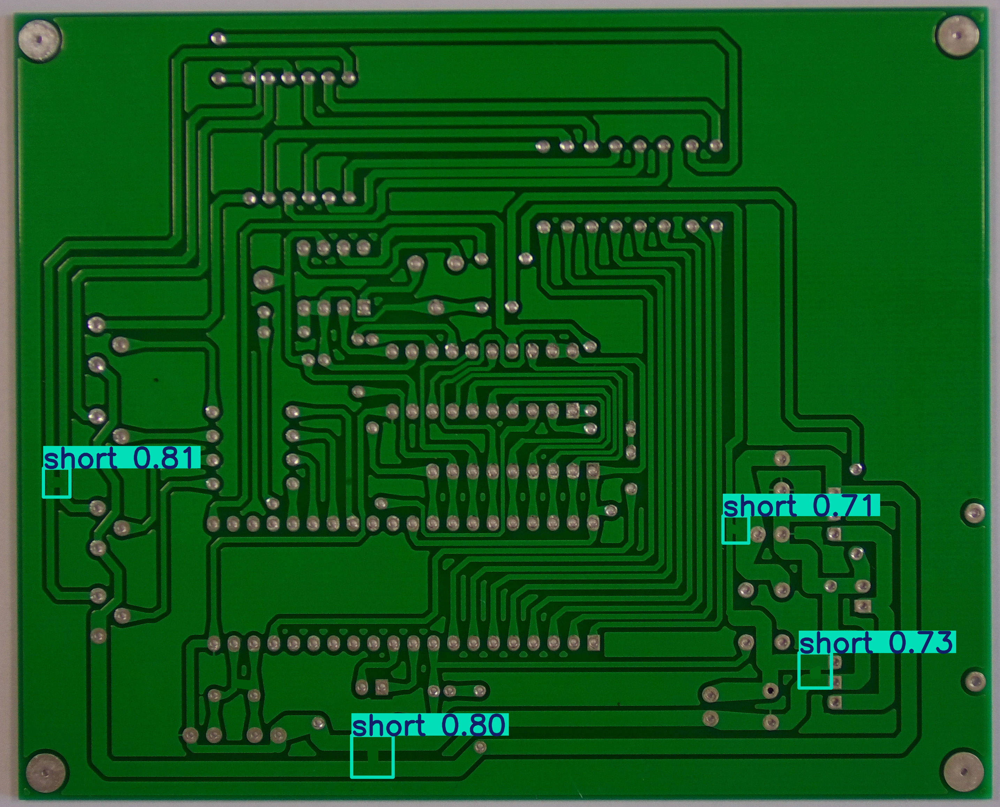

In [26]:
from ultralytics import YOLO

# Load the trained model
model = YOLO("/content/runs/detect/train7/weights/best.pt")  # Replace with the actual path to your best.pt file

# Specify the path to your test image
test_image_path = "/content/pcb_defects_yolo/images/val/06_short_07.jpg"  # Replace with the path to your image

# Run inference on the test image
results = model(test_image_path)

# Display the results
for r in results:
    r.show()

In [ ]:
from ultralytics import YOLO

# Use yolov8n.pt temporarily if yolo12n.pt is not available
model = YOLO("yolo12m.pt")

results = model.train(
    data="pcb.yaml",
    epochs=60,
    imgsz=640,
    batch=32,
    lr0=0.002
)


In [ ]:
from ultralytics import YOLO

# Load the trained model
model = YOLO("/content/runs/detect/train/weights/best.pt")  # Replace with the actual path to your best.pt file

# Specify the path to your test image
test_image_path = "/content/pcb-defects/images/01_missing_hole/missing_hole_01.jpg"  # Replace with the path to your image

# Run inference on the test image
results = model(test_image_path)

# Display the results
for r in results:
    r.show()

FileNotFoundError: [Errno 2] No such file or directory: '/content/runs/detect/train/weights/best.pt'

In [ ]:
!pip install -q ultralytics # Ensure ultralytics is installed in this environment
from ultralytics import YOLO
from IPython.display import Image, display
import os

# 1️⃣ Load the trained YOLOv11 model (best checkpoint)
model_path = "/content/YOLOV12_best.pt"
model = YOLO(model_path)

print("✅ YOLOv11 model loaded!")

# 2️⃣ Evaluate the model on the validation set (uses val path from pcb.yaml)
metrics = model.val()



✅ YOLOv11 model loaded!
Ultralytics 8.3.141 🚀 Python-3.11.12 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
YOLO11n summary (fused): 100 layers, 2,583,322 parameters, 0 gradients, 6.3 GFLOPs


FileNotFoundError: '/content/pcb.yaml' does not exist